In [267]:
import math
from itertools import product
import skimage as sk
import skimage.io as skio
import skimage.data as data
import skimage.transform as sktr
from skimage.color import rgb2gray
import scipy.signal as signal
import numpy as np
import cv2
from scipy.ndimage.interpolation import rotate
import matplotlib
# matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
%matplotlib inline

In [190]:
# some useful functions
def getGaussianKernel(size, sigma):
    # do we need to normalize the kernel?
    gaussian_kernel_1d = cv2.getGaussianKernel(size, sigma)
    gaussian_kernal_2d = np.outer(gaussian_kernel_1d.T, gaussian_kernel_1d)
    return gaussian_kernal_2d / np.sum(gaussian_kernal_2d)

def normalize(img):
    if img.ndim == 3:
        img = np.dstack([(img[:,:,i]-img[:,:,i].min()) for i in range(3)])
        return np.dstack([img[:,:,i]/img[:,:,i].max() for i in range(3)])
    else:
        assert img.ndim == 2
        img = img - img.min()
        return img/img.max()
    
def clip(img):
    return np.clip(img, 0, 1)

def conv(im, kernel, is_color=True):
    # function used to filter a color/gray image
    if is_color:
        # 3d image
        return np.dstack([signal.convolve2d(im[:,:,i], kernel, mode='same') for i in range(3)])
    else:
        # 2d image
        return signal.convolve2d(im, kernel, mode='same')

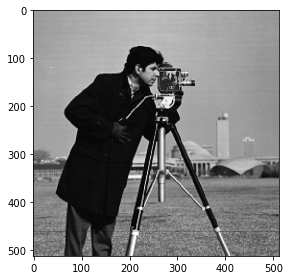

In [184]:
img = data.camera()
img = sk.img_as_float(img)
skio.imshow(img)

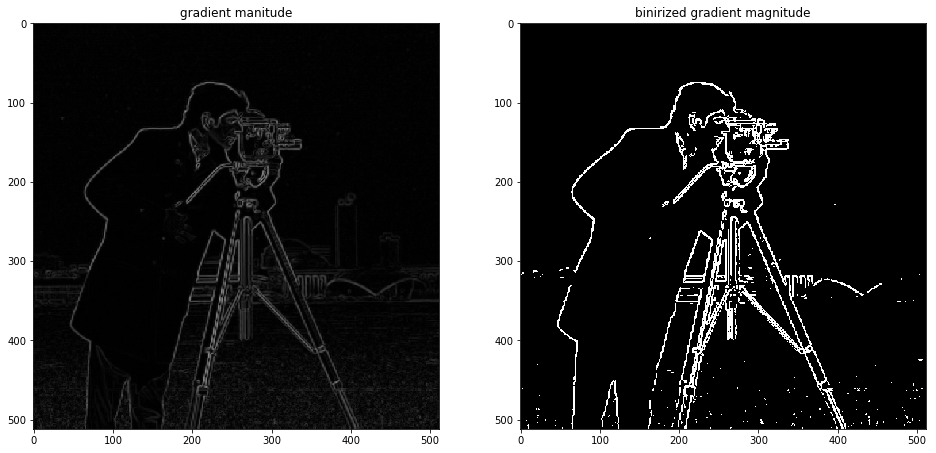

In [13]:
# p1.1
D_x = np.array([[1, -1]])
D_y = np.array([[1],
                [-1]])
img_dx = signal.convolve2d(img, D_x, mode='same')
img_dy = signal.convolve2d(img, D_y, mode='same')
grad_mag_dx = np.abs(img_dx)
grad_mag_dy = np.abs(img_dy)
grad_mag = np.sqrt(np.square(grad_mag_dx)+np.square(grad_mag_dy))
bin_grad_mag = np.where(grad_mag<0.12, 0, 1)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.imshow(grad_mag, cmap='gray')
plt.title('gradient manitude')
plt.subplot(1, 2, 2)
plt.imshow(bin_grad_mag, cmap='gray')
plt.title('binirized gradient magnitude')
plt.savefig('submission/1.1.jpg')

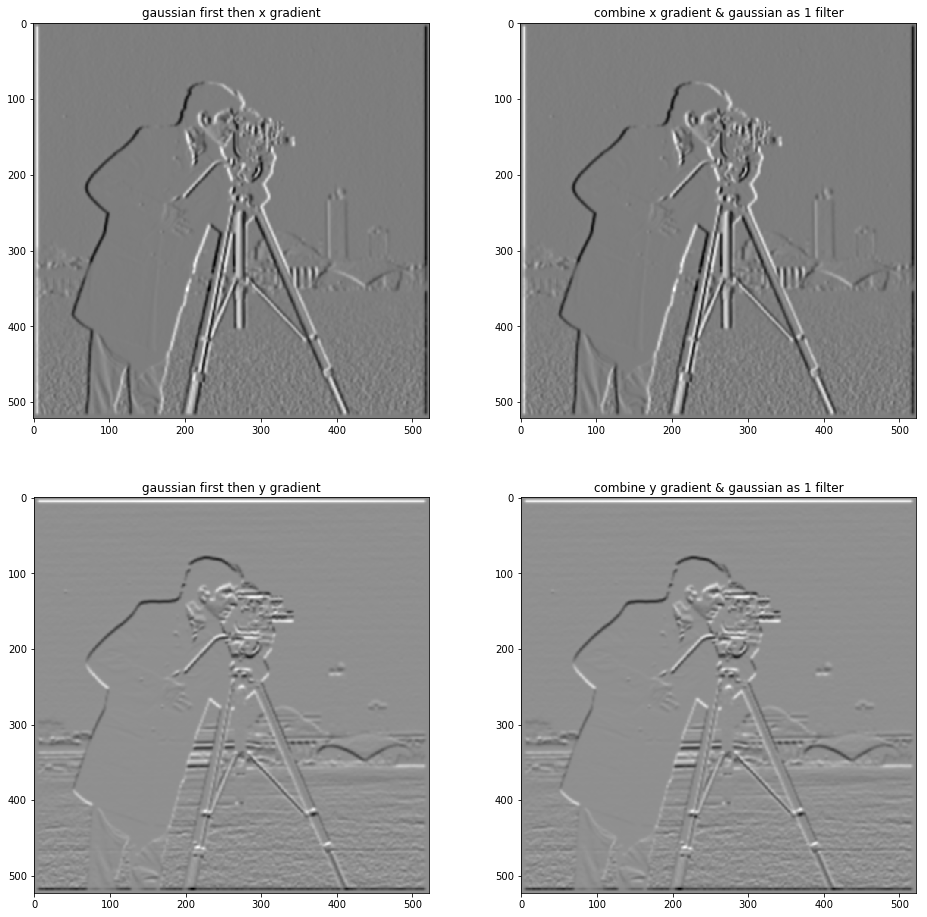

In [14]:
# p1.2
gaussian_kernel_2d = getGaussianKernel(11, 1.5)
blurred_img = signal.convolve2d(img, gaussian_kernel_2d)
# edge detection using blurred image
img_blurred_dx = signal.convolve2d(blurred_img, D_x)
img_blurred_dy = signal.convolve2d(blurred_img, D_y)
# combine gaussian and derivative filters
DoG_x = signal.convolve2d(gaussian_kernel_2d, D_x)
DoG_y = signal.convolve2d(gaussian_kernel_2d, D_y)
img_blurred_dx1 = signal.convolve2d(img, DoG_x)
img_blurred_dy1 = signal.convolve2d(img, DoG_y)

plt.figure(figsize=(16, 16))
plt.subplot(2, 2, 1)
plt.imshow(img_blurred_dx, cmap='gray')
plt.title('gaussian first then x gradient')
plt.subplot(2, 2, 2)
plt.imshow(img_blurred_dx1, cmap='gray')
plt.title('combine x gradient & gaussian as 1 filter')
plt.subplot(2, 2, 3)
plt.imshow(img_blurred_dy, cmap='gray')
plt.title('gaussian first then y gradient')
plt.subplot(2, 2, 4)
plt.imshow(img_blurred_dy1, cmap='gray')
plt.title('combine y gradient & gaussian as 1 filter')
plt.savefig('submission/1.2.jpg')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


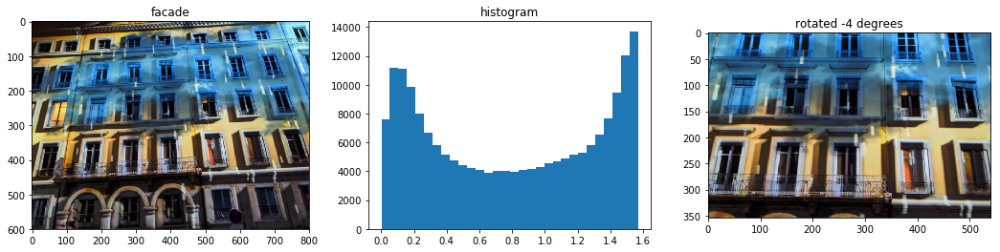

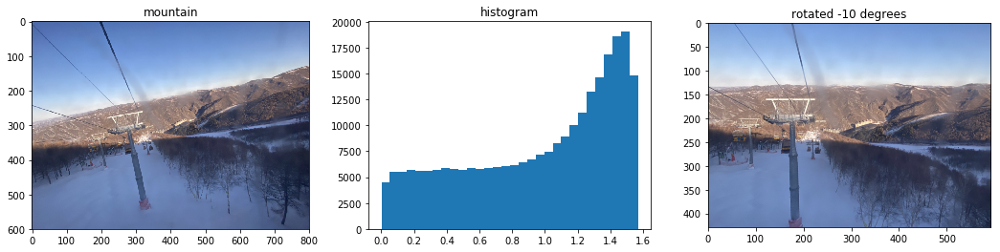

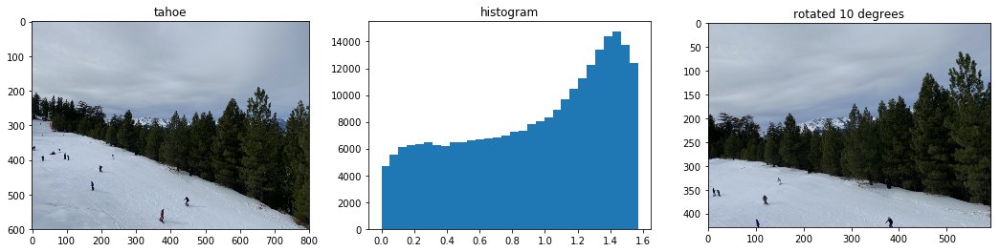

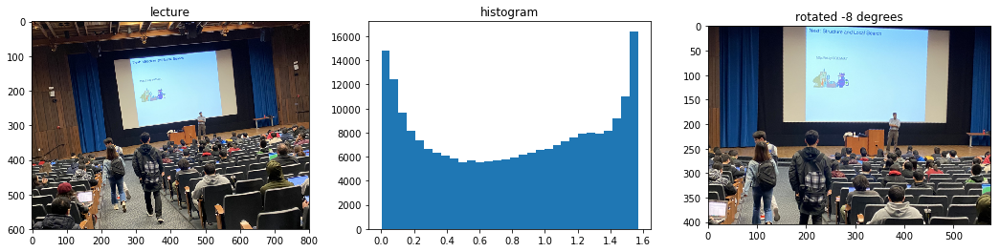

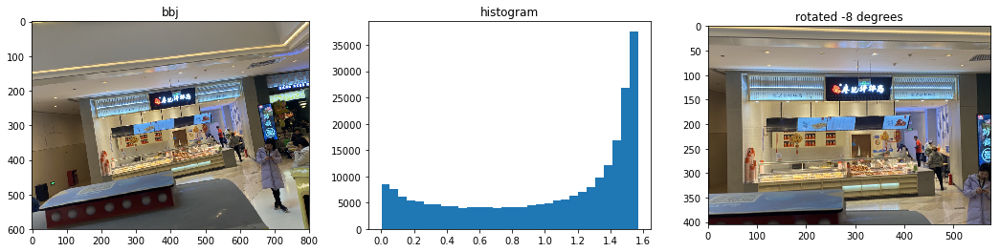

In [310]:
#p1.3
file_names = ['facade', 'mountain', 'tahoe', 'lecture', 'bbj']
for name in file_names:
    img = skio.imread('data/' + name + '.jpg')
    img = sktr.resize(img, (600, 800))
    
    max_hist = 0
    max_grad_angles = None
    max_r_img_crop = None
    max_deg = None
    for deg in range(-10, 12, 2):
        r_img = rotate(img, deg)
        cut = 150
        r_img_crop = r_img[cut: r_img.shape[0]-cut, cut: r_img.shape[1]-cut]
        grad_x = np.sum(np.dstack(
             [np.abs(signal.convolve2d(r_img_crop[:, :, i], DoG_x, mode='same')) for i in range(3)]),
                       axis = 2)
        grad_y = np.sum(np.dstack(
             [np.abs(signal.convolve2d(r_img_crop[:, :, i], DoG_y, mode='same')) for i in range(3)]),
                       axis = 2)
        grad_angles = np.arctan(np.nan_to_num(np.divide(grad_y, grad_x)))         
        n, bins = np.histogram(grad_angles.flatten(), bins=30)
        if n[-1] > max_hist:
            max_hist = np.copy(n[-1])
            max_grad_angles = np.copy(grad_angles)
            max_r_img_crop = np.copy(r_img_crop)
            max_deg = deg
    plt.figure(figsize=(18, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title(name)
    plt.subplot(1, 3, 2)
    plt.hist(max_grad_angles.flatten(), bins=30)
    plt.title('histogram')
    plt.subplot(1, 3, 3)
    plt.imshow(max_r_img_crop)
    plt.title('rotated ' + str(max_deg) + ' degrees')
    plt.savefig('submission/1.3.'+name+'.jpg')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


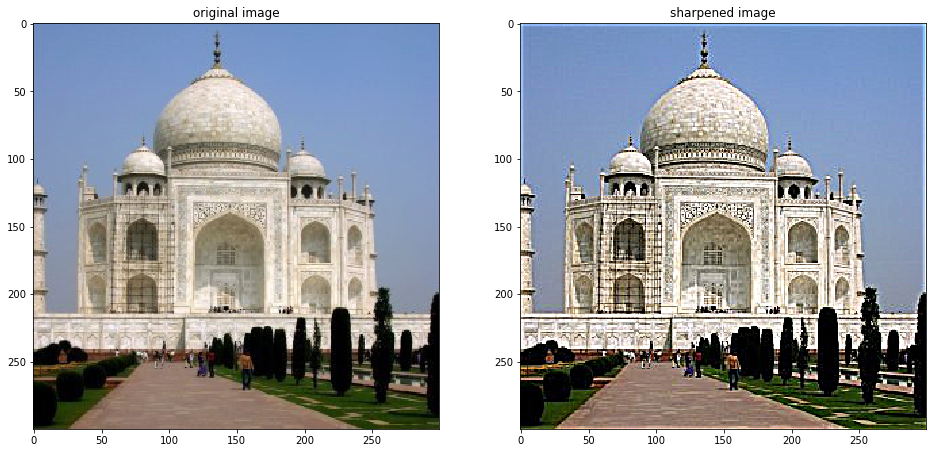

In [50]:
#p2.1
img = skio.imread('data/taj.jpg')
img = sk.img_as_float(img)

alpha = 2
gaussian_kernel_2d = getGaussianKernel(11, 1.5)
sharpen_filter = -alpha*gaussian_kernel_2d
sharpen_filter[sharpen_filter.shape[0]//2, sharpen_filter.shape[1]//2] += (1+alpha)
sharpened_img = np.clip(conv(img, sharpen_filter), 0, np.inf)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('original image')
plt.subplot(1, 2, 2)
plt.imshow(sharpened_img)
plt.title('sharpened image')
plt.savefig('submission/2.1.1.jpg')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


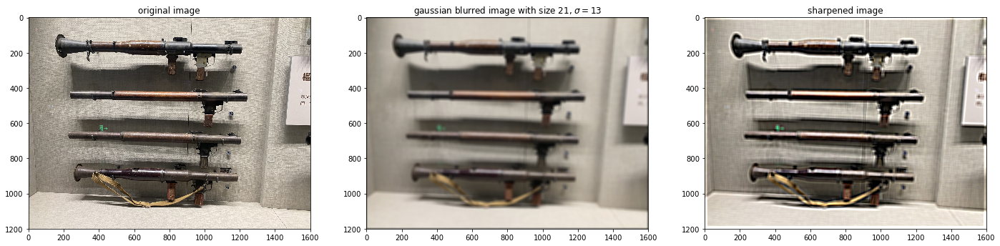

In [51]:
#p2.1
img = plt.imread('data/rpg.jpg')/255.
img = sktr.resize(img, (1200, 1600))

fig = plt.figure(figsize=(24, 8))
plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('original image')

gaussian_kernel_2d = getGaussianKernel(21, 13)
img_blurred = conv(img, gaussian_kernel_2d)
plt.subplot(1, 3, 2)
plt.imshow(img_blurred)
plt.title('gaussian blurred image with size 21, $\sigma=13$')

alpha = 5
sharpen_filter = -alpha*gaussian_kernel_2d
sharpen_filter[sharpen_filter.shape[0]//2, sharpen_filter.shape[1]//2] += (1+alpha)
sharpened_img = np.clip(conv(img_blurred, sharpen_filter), 0, np.inf)

plt.subplot(1, 3, 3)
plt.imshow(sharpened_img)
plt.title('sharpened image')
plt.savefig('submission/2.1.2.jpg')

In [84]:
#p2.2
def get_points(im1, im2):
    print('Please select 2 points in each image for alignment.')
    plt.imshow(im1)
    p1, p2 = plt.ginput(2)
    plt.close()
    plt.imshow(im2)
    p3, p4 = plt.ginput(2)
    plt.close()
    return (p1, p2, p3, p4)

def recenter(im, r, c):
    R, C, _ = im.shape
    rpad = (int) (np.abs(2*r+1 - R))
    cpad = (int) (np.abs(2*c+1 - C))
    return np.pad(
        im, [(0 if r > (R-1)/2 else rpad, 0 if r < (R-1)/2 else rpad),
             (0 if c > (C-1)/2 else cpad, 0 if c < (C-1)/2 else cpad),
             (0, 0)], 'constant')

def find_centers(p1, p2):
    cx = np.round(np.mean([p1[0], p2[0]]))
    cy = np.round(np.mean([p1[1], p2[1]]))
    return cx, cy

def align_image_centers(im1, im2, pts):
    p1, p2, p3, p4 = pts
    h1, w1, b1 = im1.shape
    h2, w2, b2 = im2.shape
    
    cx1, cy1 = find_centers(p1, p2)
    cx2, cy2 = find_centers(p3, p4)

    im1 = recenter(im1, cy1, cx1)
    im2 = recenter(im2, cy2, cx2)
    return im1, im2

def rescale_images(im1, im2, pts):
    p1, p2, p3, p4 = pts
    len1 = np.sqrt((p2[1] - p1[1])**2 + (p2[0] - p1[0])**2)
    len2 = np.sqrt((p4[1] - p3[1])**2 + (p4[0] - p3[0])**2)
    dscale = len2/len1
    if dscale < 1:
        im1 = np.dstack([sktr.rescale(im1[:, :, i], dscale) for i in range(3)])
    else:
        im2 = np.dstack([sktr.rescale(im2[:, :, i], 1./dscale) for i in range(3)])
    return im1, im2

def rotate_im1(im1, im2, pts):
    p1, p2, p3, p4 = pts
    theta1 = math.atan2(-(p2[1] - p1[1]), (p2[0] - p1[0]))
    theta2 = math.atan2(-(p4[1] - p3[1]), (p4[0] - p3[0]))
    dtheta = theta2 - theta1
    im1 = sktr.rotate(im1, dtheta*180/np.pi)
    return im1, dtheta

def match_img_size(im1, im2):
    # Make images the same size
    h1, w1, c1 = im1.shape
    h2, w2, c2 = im2.shape
    if h1 < h2:
        im2 = im2[int(np.floor((h2-h1)/2.)) : -int(np.ceil((h2-h1)/2.)), :, :]
    elif h1 > h2:
        im1 = im1[int(np.floor((h1-h2)/2.)) : -int(np.ceil((h1-h2)/2.)), :, :]
    if w1 < w2:
        im2 = im2[:, int(np.floor((w2-w1)/2.)) : -int(np.ceil((w2-w1)/2.)), :]
    elif w1 > w2:
        im1 = im1[:, int(np.floor((w1-w2)/2.)) : -int(np.ceil((w1-w2)/2.)), :]
    assert im1.shape == im2.shape
    return im1, im2

def align_images(im1, im2):
    pts = get_points(im1, im2)
    im1, im2 = align_image_centers(im1, im2, pts)
    im1, im2 = rescale_images(im1, im2, pts)
    im1, angle = rotate_im1(im1, im2, pts)
    im1, im2 = match_img_size(im1, im2)
    return im1, im2

def hybrid(im1, im2, is_color=True):
    gaussian_kernel_2d = getGaussianKernel(35, 27)
    im2_low = conv(im2, gaussian_kernel_2d, is_color=is_color)
    
    gaussian_kernel_2d = getGaussianKernel(35, 27)
    highpass_filter = -gaussian_kernel_2d
    highpass_filter[highpass_filter.shape[0]//2, highpass_filter.shape[1]//2] += 1.0
    
    im1_high = conv(im1, highpass_filter, is_color=is_color)
    
    im_hybrid = (im1_high + im2_low)/2.0
    return im_hybrid, im1_high, im2_low


In [161]:
#p2.2
%matplotlib qt
# high sf
im1 = plt.imread('data/nutmeg.jpg')/255.
im1_gray = rgb2gray(im1)
# low sf
im2 = plt.imread('data/DerekPicture.jpg')/255.
im2_gray = rgb2gray(im2)
# Next align images (this code is provided, but may be improved)
im1_aligned, im2_aligned = align_images(im1, im2)

Please select 2 points in each image for alignment.


In [162]:
#p2.2
%matplotlib inline
# todo use gray image
im1_aligned_gray = rgb2gray(im1_aligned)
im2_aligned_gray = rgb2gray(im2_aligned)
im_hybrid, im1_high, im2_low = hybrid(im1_aligned_gray, im2_aligned_gray, is_color=False)

(1193, 747)


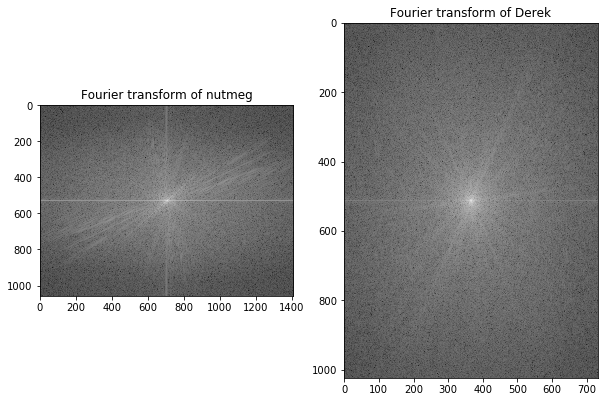

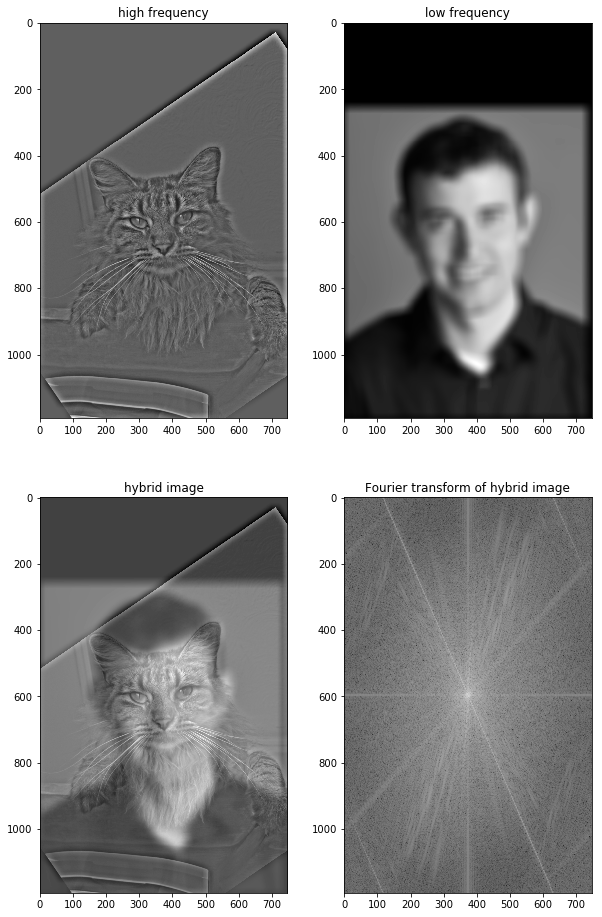

In [164]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1_gray)))), cmap='gray')
plt.title('Fourier transform of nutmeg')
plt.subplot(1, 2, 2)
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2_gray)))), cmap='gray')
plt.title('Fourier transform of Derek')
plt.savefig('submission/2.2.1.jpg')

plt.figure(figsize=(10, 16))
plt.subplot(2, 2, 1)
plt.imshow(im1_high, cmap='gray')
plt.title('high frequency')
plt.subplot(2, 2, 2)
plt.imshow(im2_low, cmap='gray')
plt.title('low frequency')
plt.subplot(2, 2, 3)
plt.imshow(im_hybrid, cmap='gray')
plt.title('hybrid image')
plt.imsave('data/hybrid1.jpg', im_hybrid, cmap='gray')
plt.subplot(2, 2, 4)
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im_hybrid)))), cmap='gray')
plt.title('Fourier transform of hybrid image')
plt.savefig('submission/2.2.2.jpg')

In [193]:
#p2.2
%matplotlib qt
im1 = plt.imread('data/j20.jpg')/255.
im1_gray = rgb2gray(im1)
im2 = plt.imread('data/f35.jpg')/255.
im2_gray = rgb2gray(im2)
im1_aligned, im2_aligned = align_images(im1, im2)

Please select 2 points in each image for alignment.


In [194]:
%matplotlib inline
im1_aligned_gray = rgb2gray(im1_aligned)
im2_aligned_gray = rgb2gray(im2_aligned)
im_hybrid, im1_high, im2_low = hybrid(im1_aligned, im2_aligned, is_color=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


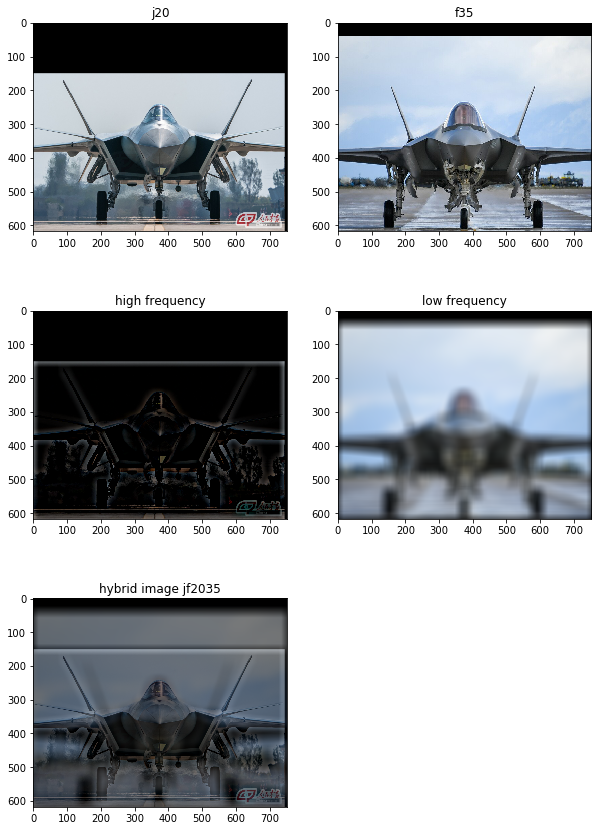

In [195]:
plt.figure(figsize=(10, 15))
plt.subplot(3, 2, 1)
plt.imshow(im1_aligned)
plt.title('j20')
plt.subplot(3, 2, 2)
plt.imshow(im2_aligned)
plt.title('f35')
plt.subplot(3, 2, 3)
plt.imshow(im1_high)
plt.title('high frequency')
plt.subplot(3, 2, 4)
plt.imshow(im2_low)
plt.title('low frequency')
plt.subplot(3, 2, 5)
plt.imshow(im_hybrid)
plt.title('hybrid image jf2035')
plt.imsave('data/hybrid2.jpg', clip(im_hybrid))
plt.savefig('submission/2.2.3.jpg')

In [177]:
#p2.2
%matplotlib qt
# high sf
im1 = plt.imread('data/nutmeg.jpg')/255.
im1_gray = rgb2gray(im1)
# low sf
im2 = plt.imread('data/DerekPicture.jpg')/255.
im2_gray = rgb2gray(im2)
# Next align images (this code is provided, but may be improved)
im1_aligned, im2_aligned = align_images(im1, im2)

Please select 2 points in each image for alignment.


In [178]:
#p2.2
%matplotlib inline
im1_aligned_gray = rgb2gray(im1_aligned)
im2_aligned_gray = rgb2gray(im2_aligned)
im_hybrid, im1_high, im2_low = hybrid(im1_aligned, im2_aligned, is_color=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


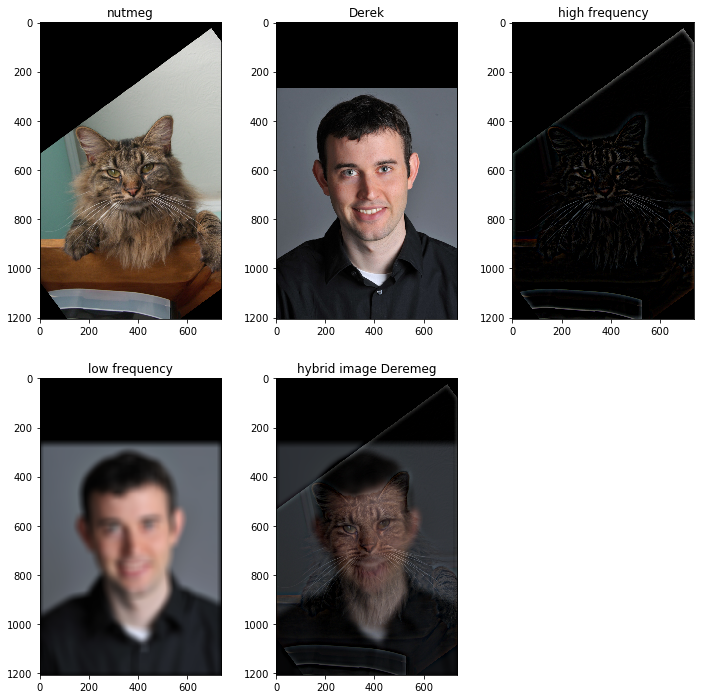

In [192]:
plt.figure(figsize=(12, 12))
plt.subplot(2, 3, 1)
plt.imshow(im1_aligned)
plt.title('nutmeg')
plt.subplot(2, 3, 2)
plt.imshow(im2_aligned)
plt.title('Derek')
plt.subplot(2, 3, 3)
plt.imshow(im1_high)
plt.title('high frequency')
plt.subplot(2, 3, 4)
plt.imshow(im2_low)
plt.title('low frequency')
plt.subplot(2, 3, 5)
plt.imshow(im_hybrid)
plt.title('hybrid image Deremeg')
plt.imsave('data/hybrid3.jpg', clip(im_hybrid))
plt.savefig('submission/2.2.4.jpg')

In [131]:
def im_stack(level, img, is_color=True):
    
    gaussian_stack = [img]
    for i in range(level):
        gaussian_kernel_2d = getGaussianKernel(6*2**(i), 2**(i+1)-1)
        gaussian_stack.append(conv(gaussian_stack[-1], gaussian_kernel_2d, is_color=is_color))
    laplacian_stack = [(fst - sec) for fst, sec in zip(gaussian_stack[:-1], gaussian_stack[1:])]
    laplacian_stack.append(gaussian_stack[-1])
    return gaussian_stack, laplacian_stack

In [207]:
#p2.3
img = plt.imread('data/lisa.jpg')/255.
img = sktr.resize(img, (800, 600))
level = 5
gaussian_stack, laplacian_stack = im_stack(level, img)

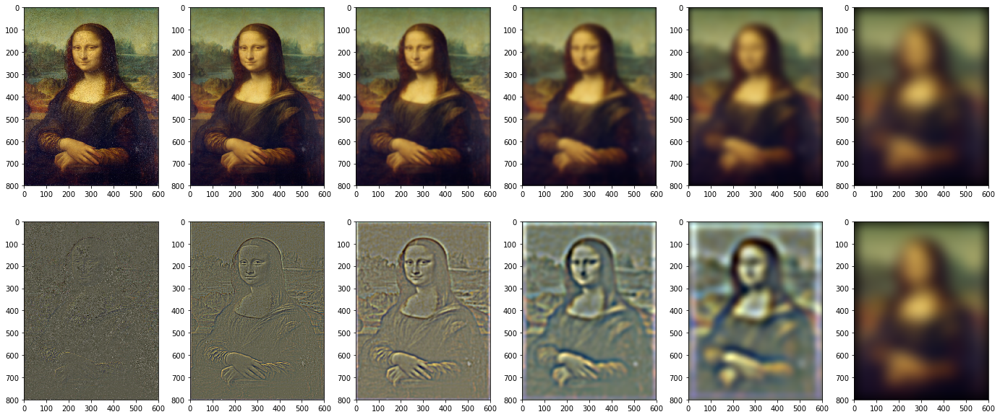

In [210]:
plt.figure(figsize=(24, 10))
for i in range(len(gaussian_stack)):
    plt.subplot(2, len(gaussian_stack), i+1)
    plt.imshow(gaussian_stack[i])

for i in range(len(laplacian_stack)):
    plt.subplot(2, len(laplacian_stack), len(gaussian_stack)+i+1)
    im = lambda i: normalize(laplacian_stack[i]) if i != len(laplacian_stack)-1 else laplacian_stack[i]
    plt.imshow(im(i))
    plt.savefig('submission/2.3.1.jpg')

In [306]:
#p2.3
img = plt.imread('data/gala.jpg')/255.
img = sktr.resize(img, (800, 600))
level = 5
gaussian_stack, laplacian_stack = im_stack(level, img)

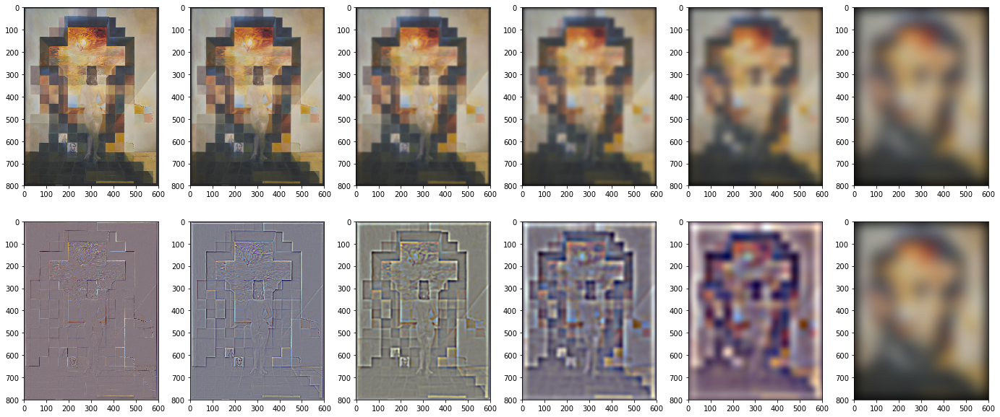

In [307]:
plt.figure(figsize=(24, 10))
for i in range(len(gaussian_stack)):
    plt.subplot(2, len(gaussian_stack), i+1)
    plt.imshow(gaussian_stack[i])

for i in range(len(laplacian_stack)):
    plt.subplot(2, len(laplacian_stack), len(gaussian_stack)+i+1)
    im = lambda i: normalize(laplacian_stack[i]) if i != len(laplacian_stack)-1 else laplacian_stack[i]
    plt.imshow(im(i))
    plt.savefig('submission/2.3.1.1.jpg')

In [211]:
#p2.3
img = plt.imread('data/hybrid1.jpg')/255.
level = 5
gaussian_stack, laplacian_stack = im_stack(level, img)

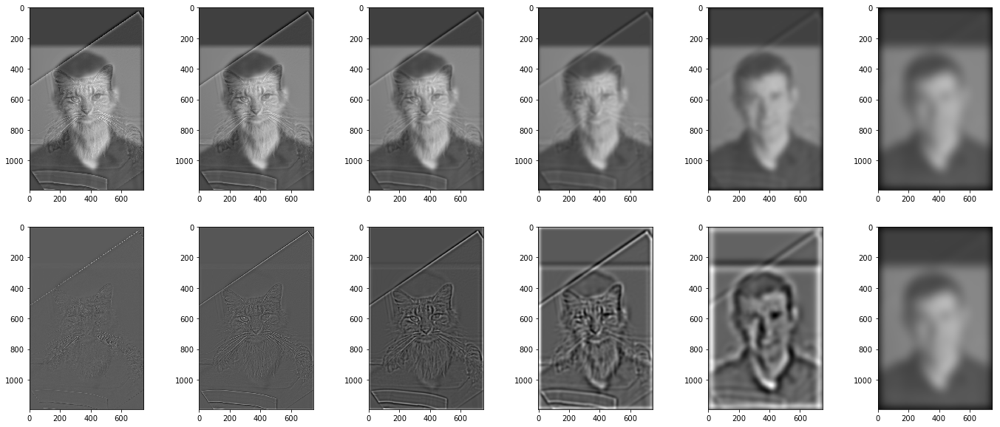

In [214]:
plt.figure(figsize=(24, 10))
for i in range(len(gaussian_stack)):
    plt.subplot(2, len(gaussian_stack), i+1)
    plt.imshow(gaussian_stack[i])

for i in range(len(laplacian_stack)):
    plt.subplot(2, len(laplacian_stack), len(gaussian_stack)+i+1)
    im = lambda i: normalize(laplacian_stack[i]) if i != len(laplacian_stack)-1 else laplacian_stack[i]
    plt.imshow(im(i))
    plt.savefig('submission/2.3.2.jpg')

In [215]:
#p2.3
img = plt.imread('data/hybrid2.jpg')/255.
level = 5
gaussian_stack, laplacian_stack = im_stack(level, img)

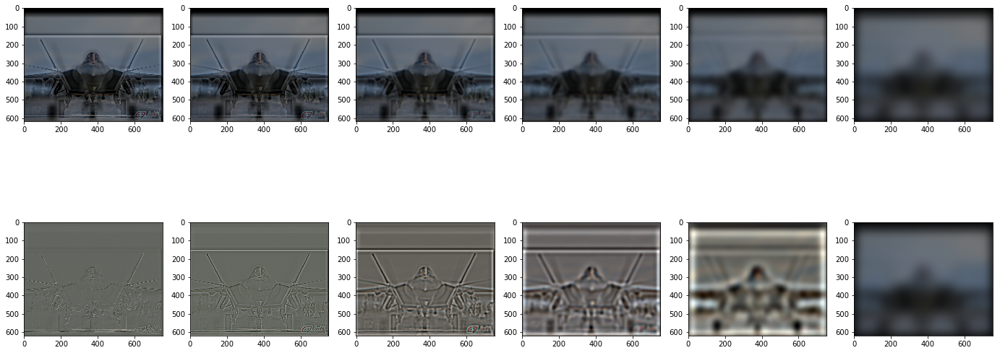

In [216]:
plt.figure(figsize=(24, 10))
for i in range(len(gaussian_stack)):
    plt.subplot(2, len(gaussian_stack), i+1)
    plt.imshow(gaussian_stack[i])

for i in range(len(laplacian_stack)):
    plt.subplot(2, len(laplacian_stack), len(gaussian_stack)+i+1)
    im = lambda i: normalize(laplacian_stack[i]) if i != len(laplacian_stack)-1 else laplacian_stack[i]
    plt.imshow(im(i))
#     plt.imshow(laplacian_stack[i])
    plt.savefig('submission/2.3.3.jpg')

In [217]:
#p2.3
img = plt.imread('data/hybrid3.jpg')/255.
level = 5
gaussian_stack, laplacian_stack = im_stack(level, img)

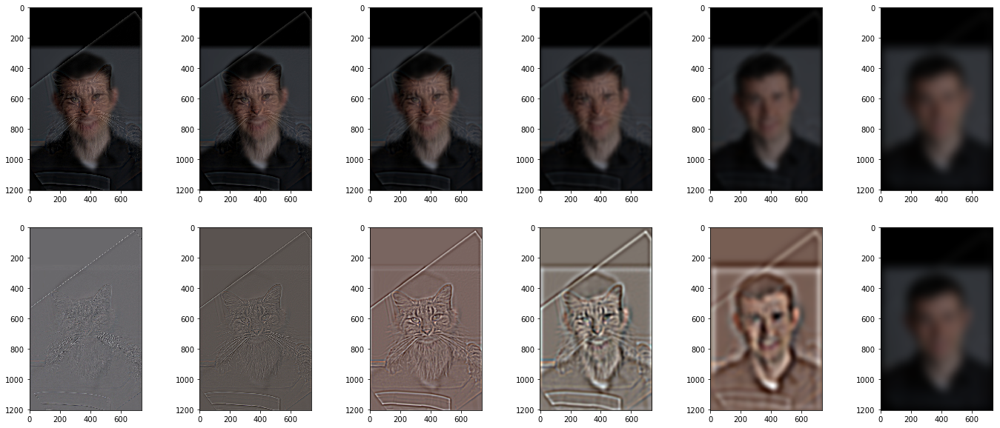

In [222]:
plt.figure(figsize=(24, 10))
for i in range(len(gaussian_stack)):
    plt.subplot(2, len(gaussian_stack), i+1)
    plt.imshow(gaussian_stack[i])

for i in range(len(laplacian_stack)):
    plt.subplot(2, len(laplacian_stack), len(gaussian_stack)+i+1)
    
    im = lambda i: normalize(laplacian_stack[i]) if i != len(laplacian_stack)-1 else laplacian_stack[i]
    plt.imshow(im(i))
    plt.savefig('submission/2.3.4.jpg')

In [314]:
def blend(im1, im2, level, **kwargs):
    assert im1.shape == im2.shape
    shape = im1.shape
    if 'mask' not in list(kwargs.keys()):
        mask = np.vstack([np.concatenate([np.zeros(shape[1]//2), np.ones(shape[1]-shape[1]//2)]) 
                          for i in range(shape[0])])
        mask = np.dstack([mask for i in range(3)])
    else:
        mask = kwargs['mask']

    G_1, L_1 = im_stack(level, im1)
    G_2, L_2 = im_stack(level, im2)
    GR, LR = im_stack(level, mask)

    return np.sum([GR[i]*L_1[i] + (1-GR[i])*L_2[i] for i in range(level+1)], axis=0), L_1, L_2, GR

In [315]:
#p2.4
im1 = plt.imread('data/orange.jpg')/255.
im2 = plt.imread('data/apple.jpg')/255.
blended_img, L_1, L_2, GR = blend(im1, im2, level=5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


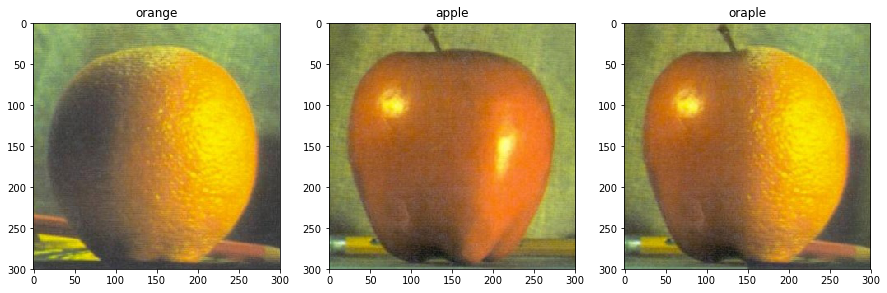

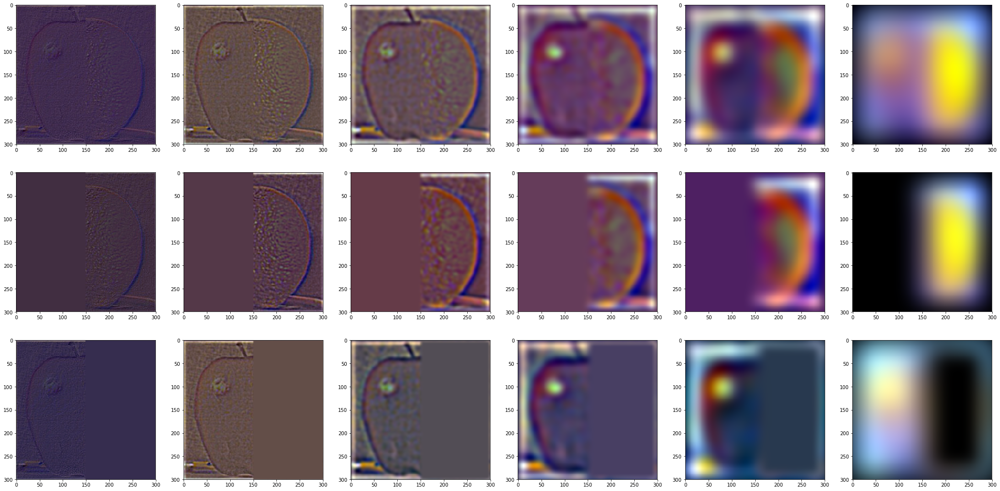

In [326]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(im1)
plt.title('orange')
plt.subplot(1, 3, 2)
plt.imshow(im2)
plt.title('apple')
plt.subplot(1, 3, 3)
plt.imshow(blended_img)
plt.title('oraple')
plt.savefig('submission/2.4.1.jpg')

plt.figure(figsize=(36, 18))
for i in range(len(GR)):
    plt.subplot(3, len(GR), i+1)
    plt.imshow(normalize(GR[i]*L_1[i]+(1-GR[i])*L_2[i]))
    plt.subplot(3, len(GR), i+len(GR)+1)
    plt.imshow(normalize(GR[i]*L_1[i]))
    plt.subplot(3, len(GR), i+2*len(GR)+1)
    plt.imshow((normalize((1-GR[i])*L_2[i])))
    plt.savefig('submission/2.4.1.1.jpg')

In [330]:
#p2.4
im1 = plt.imread('data/j20_c.jpg')/255.
im1 = sktr.resize(im1, (450, 600))
im2 = plt.imread('data/f35_c.jpg')/255.
im2 = sktr.resize(im2, (450, 600))
blended_img, L_1, L_2, GR = blend(im1, im2, level=5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


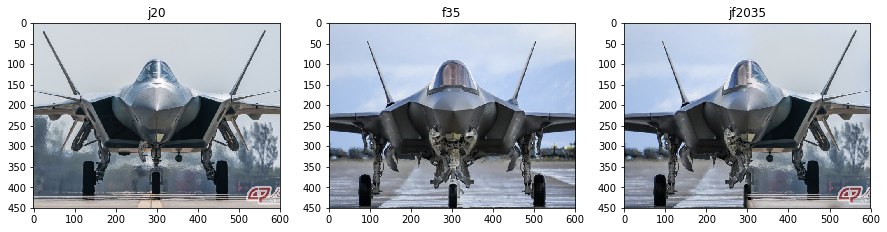

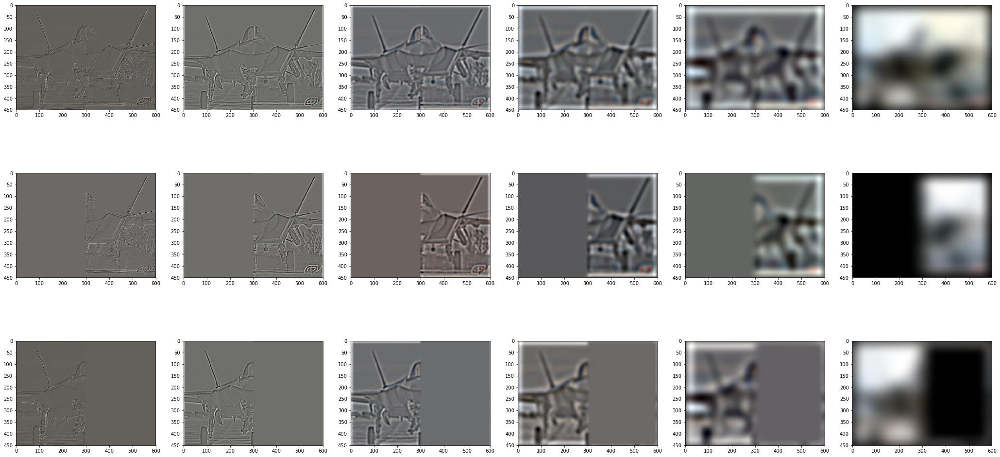

In [331]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(im1)
plt.title('j20')
plt.subplot(1, 3, 2)
plt.imshow(im2)
plt.title('f35')
plt.subplot(1, 3, 3)
plt.imshow(blended_img)
plt.title('jf2035')
plt.savefig('submission/2.4.2.jpg')

plt.figure(figsize=(36, 18))
for i in range(len(GR)):
    plt.subplot(3, len(GR), i+1)
    plt.imshow(normalize(GR[i]*L_1[i]+(1-GR[i])*L_2[i]))
    plt.subplot(3, len(GR), i+len(GR)+1)
    plt.imshow(normalize(GR[i]*L_1[i]))
    plt.subplot(3, len(GR), i+2*len(GR)+1)
    plt.imshow((normalize((1-GR[i])*L_2[i])))
    plt.savefig('submission/2.4.2.1.jpg')

In [332]:
#p2.4
im1 = plt.imread('data/me.png')
im1 = sktr.resize(im1, (im1.shape[0]//2, im1.shape[1]//2))
alpha  = im1[:,:,3]

im2 = plt.imread('data/wanlong.jpg')
im2 = sktr.resize(im2, (900, 1200))

im3 = plt.imread('data/snow.jpg')
im3 = sktr.resize(im3, (900, 1200))

mask = np.zeros((900, 1200))
x, y = 270, 450
for i, j in product(range(alpha.shape[0]), range(alpha.shape[1])):
    if alpha[i, j] == 1:
        mask[i+x, j+y] = 1
mask = np.dstack([mask for i in range(3)])
blended_img, L_1, L_2, GR = blend(im3, im2, level=5, mask=mask)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


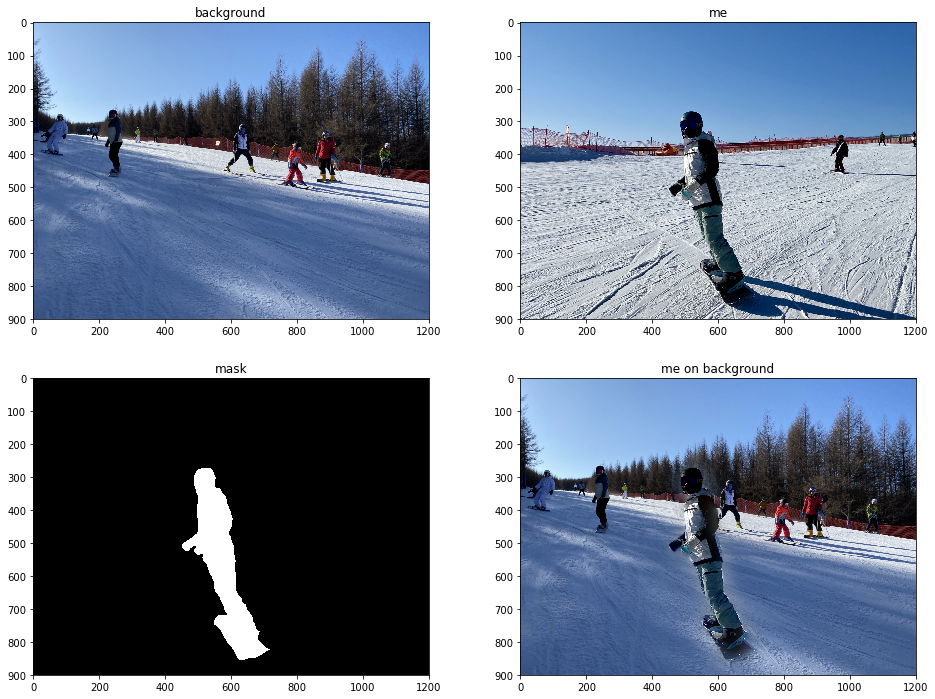

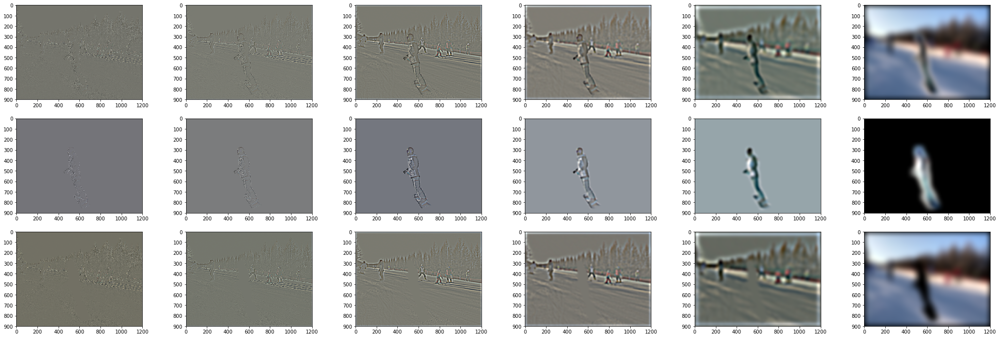

In [334]:
plt.figure(figsize=(16, 12))
plt.subplot(2, 2, 1)
plt.imshow(im2)
plt.title('background')
plt.subplot(2, 2, 2)
plt.imshow(im3)
plt.title('me')
plt.subplot(2, 2, 3)
plt.imshow(mask)
plt.title('mask')
plt.subplot(2, 2, 4)
plt.imshow(blended_img)
plt.title('me on background')
plt.savefig('submission/2.4.3.jpg')

plt.figure(figsize=(36, 12))
for i in range(len(GR)):
    plt.subplot(3, len(GR), i+1)
    plt.imshow(normalize(GR[i]*L_1[i]+(1-GR[i])*L_2[i]))
    plt.subplot(3, len(GR), i+len(GR)+1)
    plt.imshow(normalize(GR[i]*L_1[i]))
    plt.subplot(3, len(GR), i+2*len(GR)+1)
    plt.imshow((normalize((1-GR[i])*L_2[i])))
    plt.savefig('submission/2.4.3.1.jpg')